In [1]:
from adversarial.attacks import attack
from adversarial.utils import dataloader
from adversarial.models import MobileNetV2

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
X_train, y_train, X_test, y_test = dataloader.load_data("data")

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(12894, 160, 160, 3) (12894,)
(500, 160, 160, 3) (500,)


In [4]:
epsilons = [0.01, 0.03, 0.1]
N = 5

In [5]:
target_model = MobileNetV2()
target_model.load_custom_weights("model/model_20200507_9_1.00_0.0088")

In [6]:
X_train_sample = X_train[np.random.randint(0, X_train.shape[0], size=N)]
y_train_sample = y_train[np.random.randint(0, X_train.shape[0], size=N)]

In [7]:
results = attack(target_model, X_train_sample, y_train_sample, epsilons)

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


In [8]:
results.keys()

dict_keys(['L2AdditiveUniformNoise', 'LinfAdditiveUniformNoise', 'L2RepeatedAdditiveUniformNoise', 'LinfRepeatedAdditiveUniformNoise', 'L2AdditiveGaussianNoiseAttack', 'RepeatedAdditiveGaussianNoise', 'LinfDeepFool', 'L2DeepFool', 'FGSM', 'PGD', 'LinfPGD', 'L2PGD'])

L2AdditiveUniformNoise
epsilon: 0.01


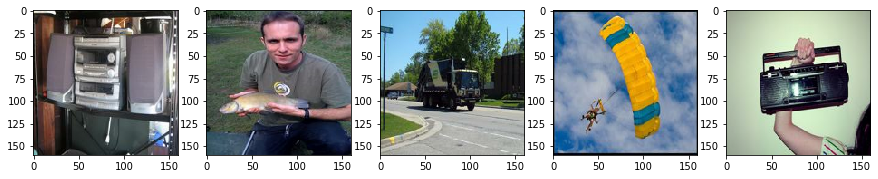

epsilon: 0.03


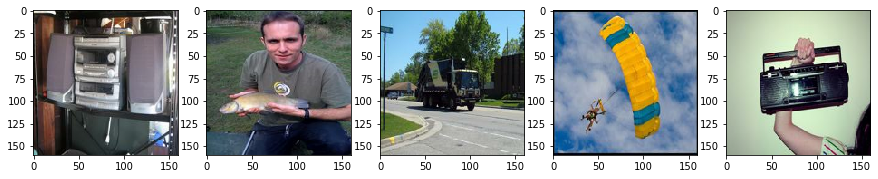

epsilon: 0.1


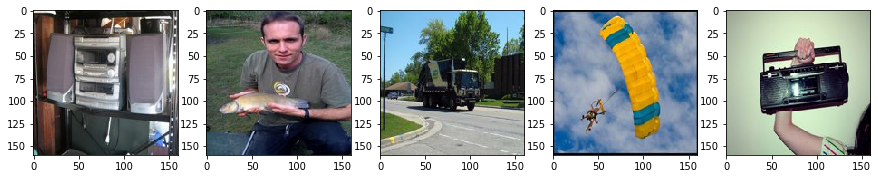

LinfAdditiveUniformNoise
epsilon: 0.01


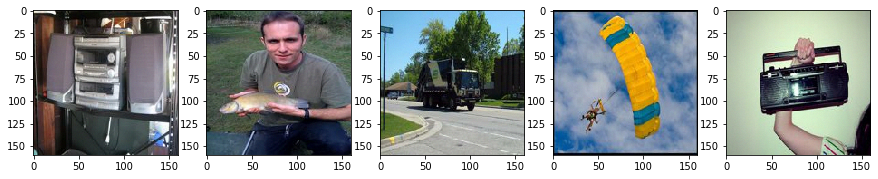

epsilon: 0.03


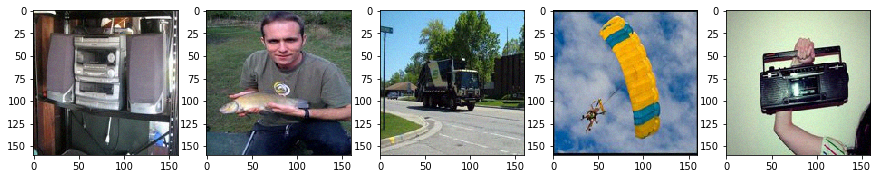

epsilon: 0.1


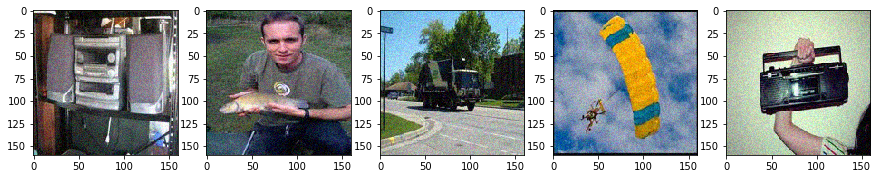

L2RepeatedAdditiveUniformNoise
epsilon: 0.01


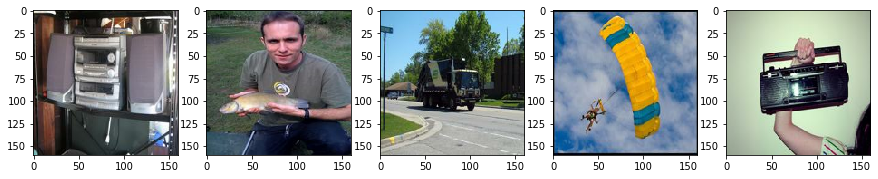

epsilon: 0.03


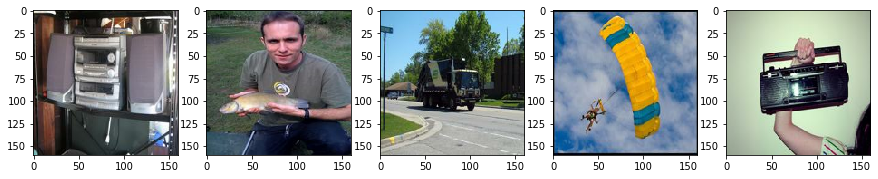

epsilon: 0.1


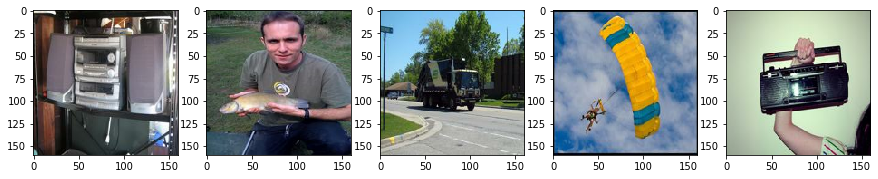

LinfRepeatedAdditiveUniformNoise
epsilon: 0.01


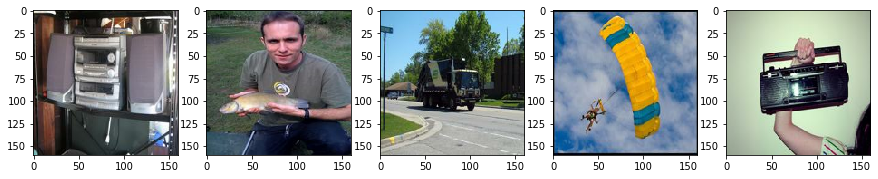

epsilon: 0.03


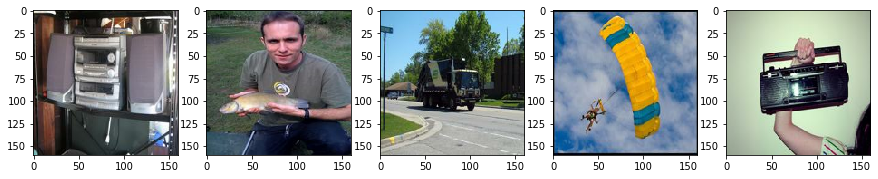

epsilon: 0.1


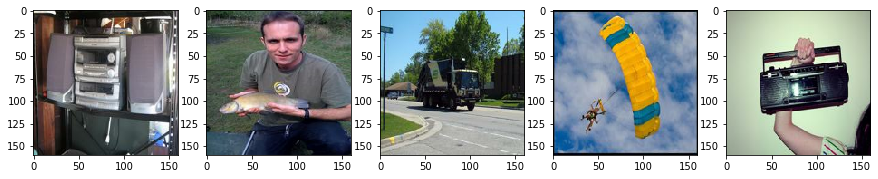

L2AdditiveGaussianNoiseAttack
epsilon: 0.01


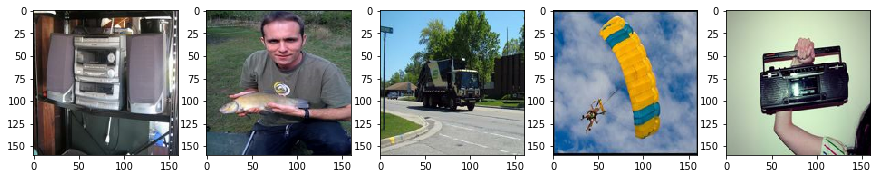

epsilon: 0.03


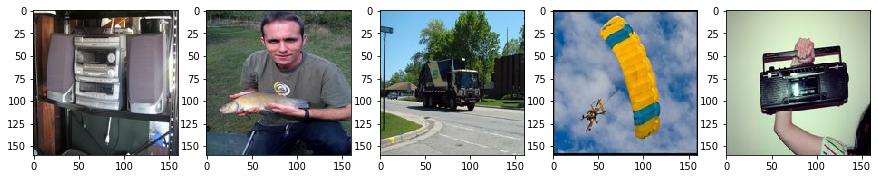

epsilon: 0.1


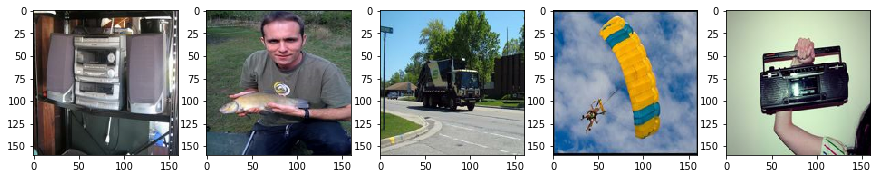

RepeatedAdditiveGaussianNoise
epsilon: 0.01


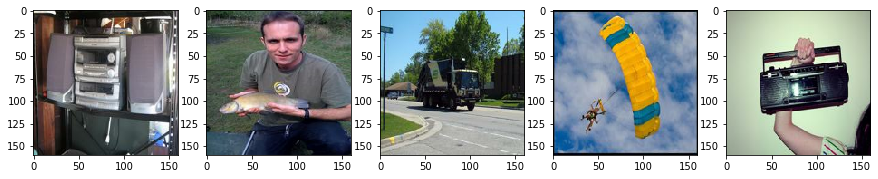

epsilon: 0.03


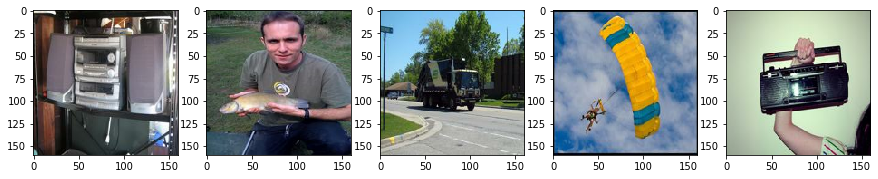

epsilon: 0.1


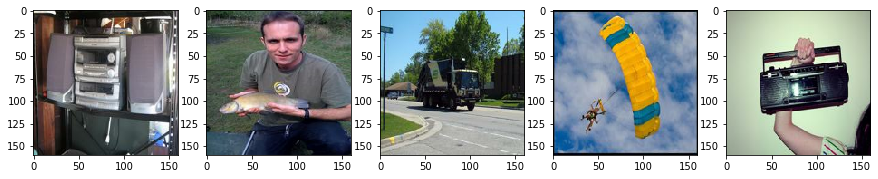

LinfDeepFool
epsilon: 0.01


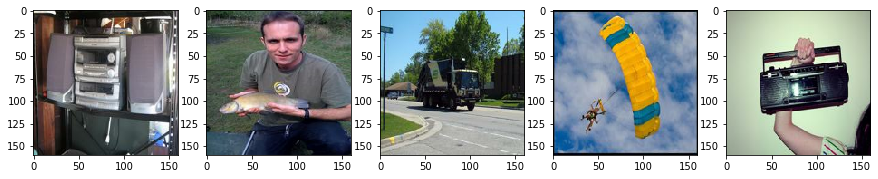

epsilon: 0.03


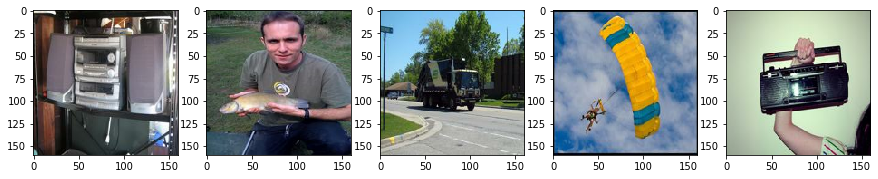

epsilon: 0.1


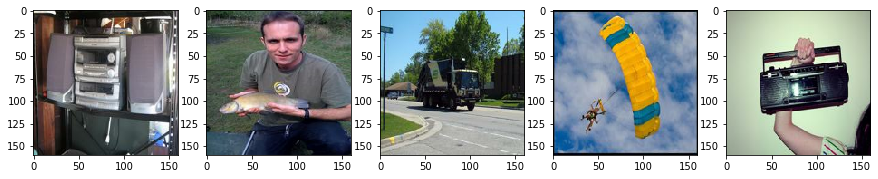

L2DeepFool
epsilon: 0.01


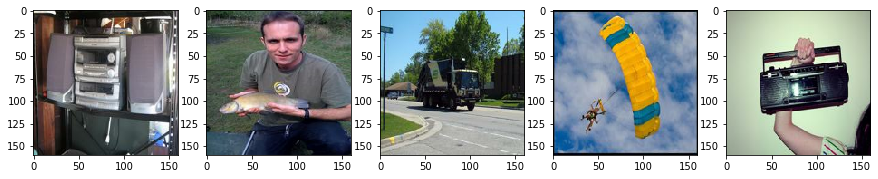

epsilon: 0.03


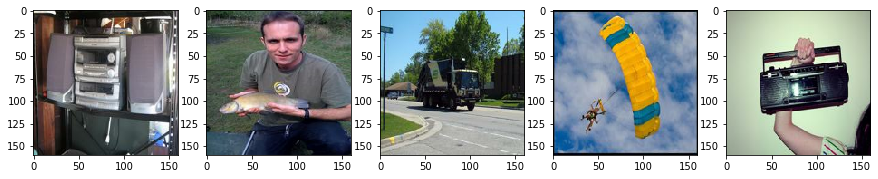

epsilon: 0.1


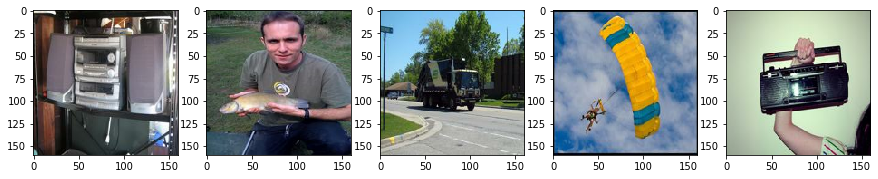

FGSM
epsilon: 0.01


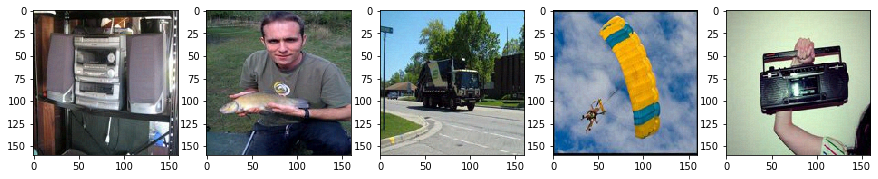

epsilon: 0.03


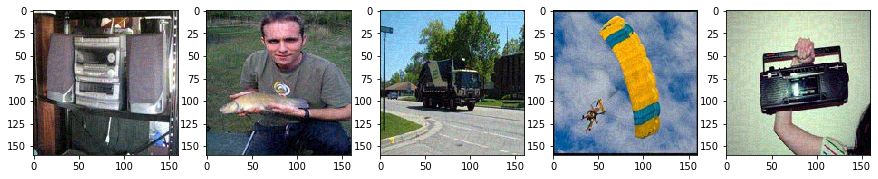

epsilon: 0.1


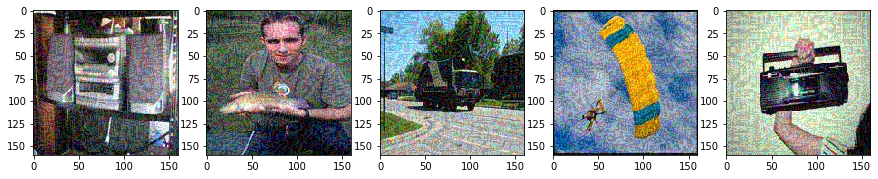

PGD
epsilon: 0.01


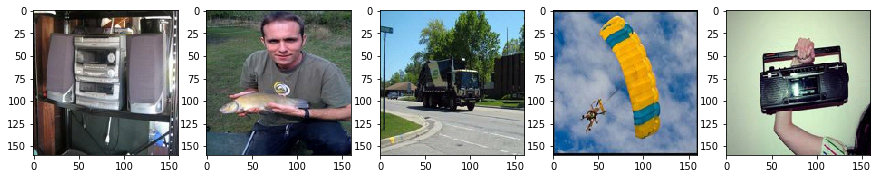

epsilon: 0.03


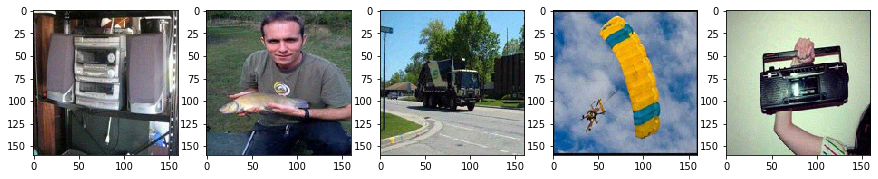

epsilon: 0.1


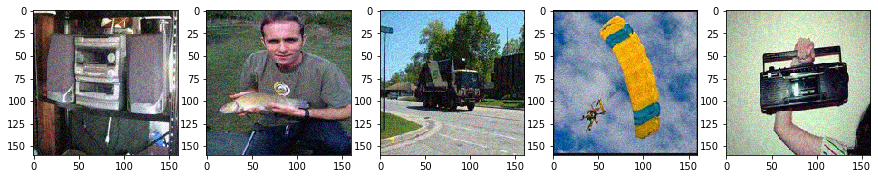

LinfPGD
epsilon: 0.01


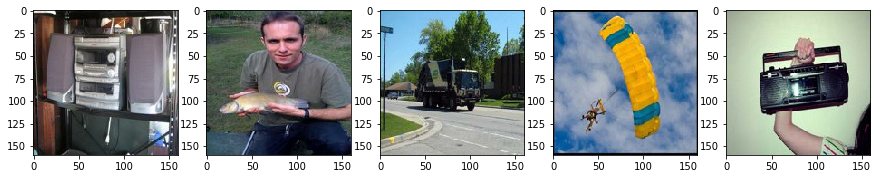

epsilon: 0.03


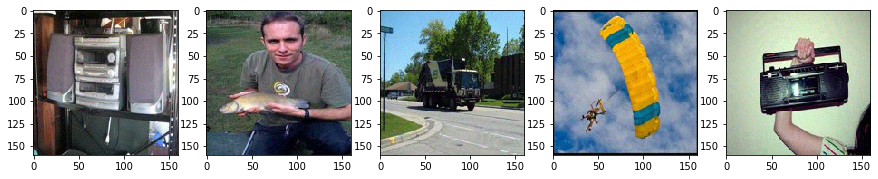

epsilon: 0.1


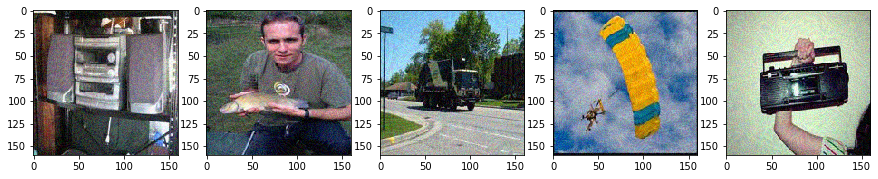

L2PGD
epsilon: 0.01


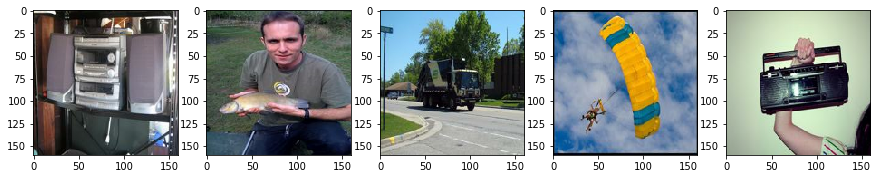

epsilon: 0.03


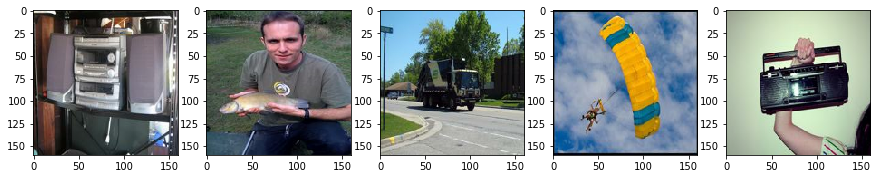

epsilon: 0.1


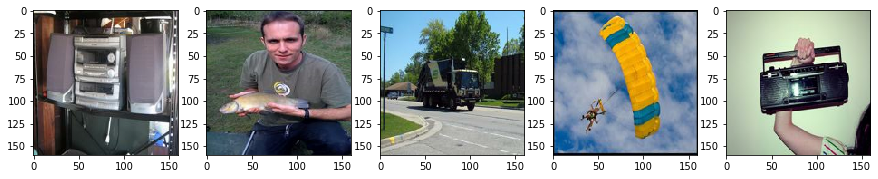

In [9]:
for k in results.keys():
    print(k)
    v = results[k]
    
    for i in range(len(epsilons)):
        print(f"epsilon: {epsilons[i]}")
        
        plt.figure(figsize=(15, 3))
        
        for j in range(N):
            plt.subplot(1, N, j+1)
            plt.imshow(v[1][i][j].numpy())
            
        plt.show()

In [10]:
for layer in target_model.layers[0].layers:
    print(layer.name)

input_1
Conv1_pad
Conv1
bn_Conv1
Conv1_relu
expanded_conv_depthwise
expanded_conv_depthwise_BN
expanded_conv_depthwise_relu
expanded_conv_project
expanded_conv_project_BN
block_1_expand
block_1_expand_BN
block_1_expand_relu
block_1_pad
block_1_depthwise
block_1_depthwise_BN
block_1_depthwise_relu
block_1_project
block_1_project_BN
block_2_expand
block_2_expand_BN
block_2_expand_relu
block_2_depthwise
block_2_depthwise_BN
block_2_depthwise_relu
block_2_project
block_2_project_BN
block_2_add
block_3_expand
block_3_expand_BN
block_3_expand_relu
block_3_pad
block_3_depthwise
block_3_depthwise_BN
block_3_depthwise_relu
block_3_project
block_3_project_BN
block_4_expand
block_4_expand_BN
block_4_expand_relu
block_4_depthwise
block_4_depthwise_BN
block_4_depthwise_relu
block_4_project
block_4_project_BN
block_4_add
block_5_expand
block_5_expand_BN
block_5_expand_relu
block_5_depthwise
block_5_depthwise_BN
block_5_depthwise_relu
block_5_project
block_5_project_BN
block_5_add
block_6_expand
bloc

In [15]:
dir(target_model.base_model.layers[-12])

['_TF_MODULE_IGNORED_PROPERTIES',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_activity_regularizer',
 '_add_inbound_node',
 '_add_trackable',
 '_add_variable_with_custom_getter',
 '_attribute_sentinel',
 '_autocast',
 '_call_accepts_kwargs',
 '_call_arg_was_passed',
 '_call_fn_args',
 '_call_full_argspec',
 '_callable_losses',
 '_checkpoint_dependencies',
 '_clear_losses',
 '_collect_input_masks',
 '_compute_dtype',
 '_compute_elemwise_op_output_shape',
 '_dedup_weights',
 '_deferred_dependencies',
 '_dtype',
 '_dtype_defaulted_to_floatx',
 '_dtype_policy',
 '_dynamic',
 '_eager_add_metric',
 '_eager_losses',
 '_expe